# make_UNet_training_set_smartspim

The purpose of this notebook is to illustrate how to make an example training/validation/test set for the 3D UNet. The training set consists of small (~300x300x75) volume subchunks of SmartSPIM 3.6x images along with labeled volumes corresponding to each of those images. These labeled volumes are just binary 3d arrays where 1 means there is a cell there. In this notebook we go through how to create these labeled volumes using <a href="https://en.wikipedia.org/wiki/Otsu%27s_method">Otsu thresholding</a>. 

A prerequisite for running this notebook on a new dataset is having annotated cell center coordinates for at least one subvolume. 

## General imports

In [1]:
import os,sys, glob, shutil, pickle
import numpy as np
from skimage import filters
import matplotlib.pyplot as plt
import tifffile
import pandas as pd
%matplotlib inline

## Clearmap specific imports

In [2]:
sys.path.append('/jukebox/wang/ahoag/ClearMap2') 

import ClearMap.IO.Workspace as wsp
import ClearMap.IO.IO as io

In [3]:
# Load in annotations from exported Neuroglancer annotation file
subvol1_annotation_file = '../data/annotations_zimmerman_01-001_subvol_x1111_y2778_z2500.csv'
df1 = pd.read_csv(subvol1_annotation_file)
df1

,Coordinate 1,Coordinate 2,Ellipsoid Dimensions,Description,Segment IDs,Segment Names,Type
0,"(1298, 2843, 2505)",NaN,NaN,NaN,NaN,NaN,Point
1,"(1137, 2964, 2504)",NaN,NaN,NaN,NaN,NaN,Point
2,"(1183, 2976, 2505)",NaN,NaN,NaN,NaN,NaN,Point
3,"(1173, 2825, 2504)",NaN,NaN,NaN,NaN,NaN,Point
4,"(1318, 2975, 2505)",NaN,NaN,NaN,NaN,NaN,Point
...,...,...,...,...,...,...,...
111,"(1281, 2888, 2510)",NaN,NaN,NaN,NaN,NaN,Point
112,"(1282, 2815, 2524)",NaN,NaN,NaN,NaN,NaN,Point
113,"(1306, 2853, 2571)",NaN,NaN,NaN,NaN,NaN,Point
114,"(1344, 2897, 2511)",NaN,NaN,NaN,NaN,NaN,Point


In [4]:
# Remove any duplicates which can happen pretty easily by accident when labeling in Neuroglancer  
df1.drop_duplicates(inplace=True)
df1

,Coordinate 1,Coordinate 2,Ellipsoid Dimensions,Description,Segment IDs,Segment Names,Type
0,"(1298, 2843, 2505)",NaN,NaN,NaN,NaN,NaN,Point
1,"(1137, 2964, 2504)",NaN,NaN,NaN,NaN,NaN,Point
2,"(1183, 2976, 2505)",NaN,NaN,NaN,NaN,NaN,Point
3,"(1173, 2825, 2504)",NaN,NaN,NaN,NaN,NaN,Point
4,"(1318, 2975, 2505)",NaN,NaN,NaN,NaN,NaN,Point
...,...,...,...,...,...,...,...
111,"(1281, 2888, 2510)",NaN,NaN,NaN,NaN,NaN,Point
112,"(1282, 2815, 2524)",NaN,NaN,NaN,NaN,NaN,Point
113,"(1306, 2853, 2571)",NaN,NaN,NaN,NaN,NaN,Point
114,"(1344, 2897, 2511)",NaN,NaN,NaN,NaN,NaN,Point


In [5]:
# Set up clearmap directory so we can easily grab a subvolume
directory = os.path.join('/jukebox/wang/ahoag/test_clearmap2/output',
             'cz15/zimmerman_01_smartspim/zimmerman_01-001',
             'imaging_request_1/output')

expression_raw      = 'ch647_renamed/corrected/Z<Z,4>.tif'    

ws = wsp.Workspace('CellMap', directory=directory);
ws.update(raw=expression_raw)
ws.debug=False
ws.info()

Workspace[CellMap]{/jukebox/wang/ahoag/test_clearmap2/output/cz15/zimmerman_01_smartspim/zimmerman_01-001/imaging_request_1/output}
              raw: ch647_renamed/corrected/Z<Z,4>.tif {3589 files, ('Z',): (0,) -> (3588,)}
 autofluorescence: no file
         stitched: stitched.npy
           layout: no file
       background: no file
        resampled: resampled.tif
                   resampled_autofluorescence.tif
resampled_to_auto: no file
auto_to_reference: no file
            cells: cells_raw.npy
                   cells_transformed_to_atlas.npy
                   cells_transformed_to_atlas_attempt1.npy
                   cells_transformed_to_atlas_attempt2.npy
                   cells_transformed_to_atlas_attempt3.npy
                   cells_transformed_to_atlas_attempt4.npy
          density: no file



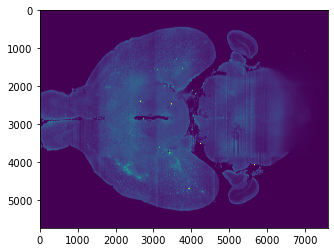

In [6]:
# Verify that it read in the stitched.npy file ok
fig=plt.figure()
ax=fig.add_subplot()
z_plane = ws.source('stitched')[:,:,2500]
ax.imshow(z_plane,vmin=0,vmax=200)


## Make the subvolume
From the name of the saved annotation file: annotations_zimmerman_01-001_subvol_x1111_y2778_z2500.csv

we know that the volume starts at (x,y,z) = (1111,2778,2500)

And we also know that it is 0.5 mm x 0.5 mm x 0.15 mm (x,y,z) in size from when we created the volume for Neuroglancer. 
The pixel scale of SmartSPIM 3.6x images is 1.8 microns x 1.8 microns x 2 microns (x,y,z) so can calculate the size in pixels of this subvolume within our larger volume.

In [7]:
subvol_pix_start = (1111,2778,2500)
mm_subvol=(0.5,0.5,0.15)
microns_per_pix = (1.8,1.8,2)
microns_subvol = [x*1000 for x in mm_subvol]
npix_subvol = [int(round(microns_subvol[ii]/microns_per_pix[ii])) for ii in range(3)]
npix_subvol # This is size of the subvoluem in pixels in x,y,z 

[278, 278, 75]

In [8]:
# Make the subvolume from the larger stitched volume by slicing
x_start = subvol_pix_start[0]
x_finish = x_start + npix_subvol[0]
y_start = subvol_pix_start[1]
y_finish = y_start + npix_subvol[1]
z_start = subvol_pix_start[2]
z_finish = z_start + npix_subvol[2]
ws.debug = 'subvol_x1111_y2778_z2500' # Set this to the cutout start coordinates
if not os.path.exists(ws.filename('stitched')):
    slicing = (slice(x_start,x_finish),slice(y_start,y_finish),slice(z_start,z_finish))
    ws.create_debug('stitched', slicing=slicing) # creates a file called 
    print(f"Created {ws.filename('stitched')}")
else:
    print(f"Stitched subvolume already exists: {ws.filename('stitched')}")

Stitched subvolume already exists: /jukebox/wang/ahoag/test_clearmap2/output/cz15/zimmerman_01_smartspim/zimmerman_01-001/imaging_request_1/output/subvol_x1111_y2778_z2500_stitched.npy


In [9]:
assert list(ws.source('stitched').shape) == npix_subvol

Now grab cells from the dataframe we loaded in in the beginning

In [10]:
# Need to get into relative coordinates of the subvolume
points1_abs = np.array(list(map(eval,df1['Coordinate 1'].values))) # coordinates relative to origin of entire brain volume
points1_rel = points1_abs-(x_start,y_start,z_start) # coordinates relative to the origin of the subvolume
points1_rel

array([[187,  65,   5],
       [ 26, 186,   4],
       [ 72, 198,   5],
       [ 62,  47,   4],
       [207, 197,   5],
       [ 70, 227,   6],
       [107, 172,  10],
       [ 27, 236,  11],
       [125,  97,   9],
       [264,  69,  10],
       [265, 110,   8],
       [211, 111,  11],
       [192, 103,  24],
       [148, 124,  24],
       [ 43, 184,  24],
       [140, 155,  18],
       [ 55, 143,  16],
       [149, 116,  14],
       [ 50, 238,  13],
       [  6, 189,  15],
       [149, 198,  17],
       [178, 144,  18],
       [143,  96,  17],
       [114,   5,  19],
       [103, 238,  19],
       [121, 248,  20],
       [167, 274,  18],
       [243, 262,  23],
       [211, 211,  23],
       [173, 130,  30],
       [197, 114,  31],
       [219, 137,  30],
       [127, 179,  30],
       [256, 227,  29],
       [ 94,  71,  29],
       [ 95, 138,  55],
       [128, 134,  51],
       [137, 122,  52],
       [151, 150,  52],
       [111, 150,  51],
       [110, 104,  44],
       [133,  61

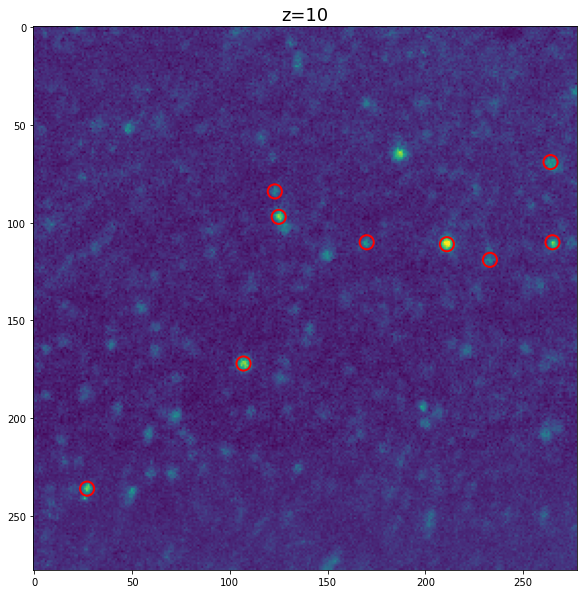

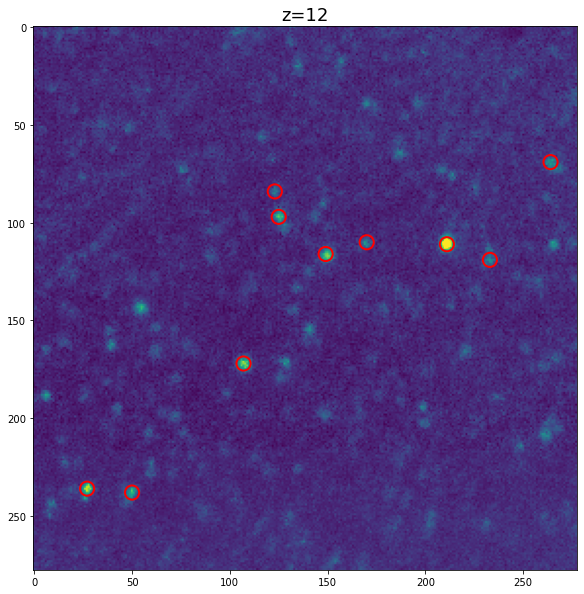

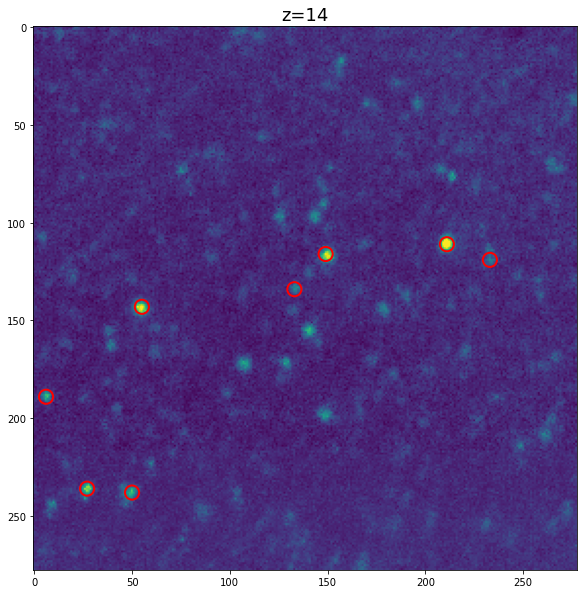

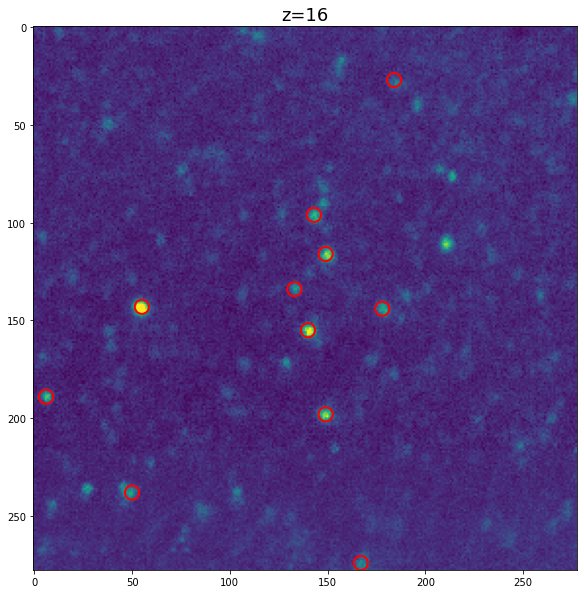

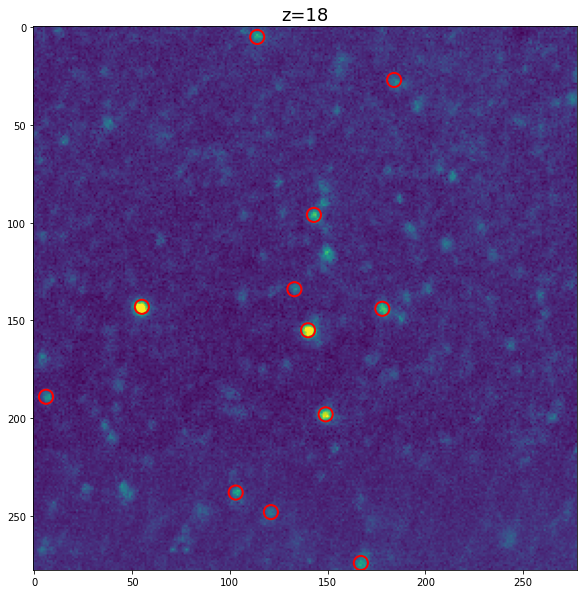

In [11]:
# Visually validate that annotations line up with real cells in this subvolume for a few different z planes
point_depth = 6 # the number of planes over we collapse in z to show image and labels. Chosen because most cells extend this many planes

for z in [10,12,14,16,18]:
    zmin=int(np.max([z-point_depth/2.,0]))
    zmax=int(np.min([z+point_depth/2.,75]))
    mean_proj = np.mean(ws.source('stitched')[:,:,zmin:zmax],axis=2)

    points1_rel_depth = np.array([point for point in points1_rel if zmin <= point[-1] < zmax])
    xs_depth = points1_rel_depth[:,0]
    ys_depth = points1_rel_depth[:,1]

    fig = plt.figure(figsize=(15,10))
    ax=fig.add_subplot(111)
    ax.imshow(mean_proj.T,vmin=0,vmax=200)

    ax.scatter(xs_depth,ys_depth,
               color="none",edgecolor='r',
               marker='o',s=200,
              linewidth=2)
    ax.set_title(f"z={z}",fontsize=18)


The red circles should be centered on a bunch of real looking cells. Assuming that is true for you as well, we're ready to make the labeled binary mask for this subvolume.

In [33]:
def make_labeled_subvol(subvolume,points):
    """ 
    ---PURPOSE---
    Takes a 3d array and a list of cell centers
    and creates a 3d array of the same shape
    that contains a binary mask where the 3d-extended
    cells are labeled = 1 in the mask
    ---INPUT---
    subvolume    A 3d array of a chunk of a SmartSPIM 3.6x volume
    points       A 2d array of cell centers in the relative to the origin of the subvolume, like:
        array([[187,  65,   5],
               [ 26, 186,   4],
               [ 72, 198,   5],
               ...,
               [233, 152,  43]])
    """
    size=(5,5,5) # (x,y,z) the half-size of the volume around each point that is used to make a cutout
    
    outarr = np.zeros_like(subvolume)
    otsu_factor=0.8 # a normalization factor for the filter threshold. Higher results in larger cell extent.
    for pnt in points:
        x_min=np.max((pnt[0]-size[0],0))
        x_max = pnt[0]+size[0]
        y_min = np.max((pnt[1]-size[1],0))
        y_max = pnt[1]+size[1]
        z_min = np.max((pnt[2]-size[2],0))
        z_max = pnt[2]+size[2]
        vol = np.copy(subvolume[x_min:x_max, y_min:y_max, z_min:z_max])*1.0
        vol = filters.gaussian(vol, sigma = 1)
        v=filters.threshold_otsu(vol)/float(otsu_factor)
        vol[vol<v]=0
        vol[vol>=v]=1
        newvol = np.maximum(outarr[x_min:x_max, y_min:y_max, z_min:z_max], vol)
        outarr[x_min:x_max, y_min:y_max, z_min:z_max]=newvol
    return outarr

In [35]:
subvol=ws.source('stitched').array

# Note that we use the cell center coordinates relative to the subvolume origin (points1_rel)
# and not the ones relative to the entire brain origin (points1_abs)
lbl_subvol = make_labeled_subvol(subvolume=subvol,
                                 points=points1_rel) 

In [14]:
# Make sure the label array and origin volume have the same dimensions 
assert lbl_subvol.shape == subvol.shape

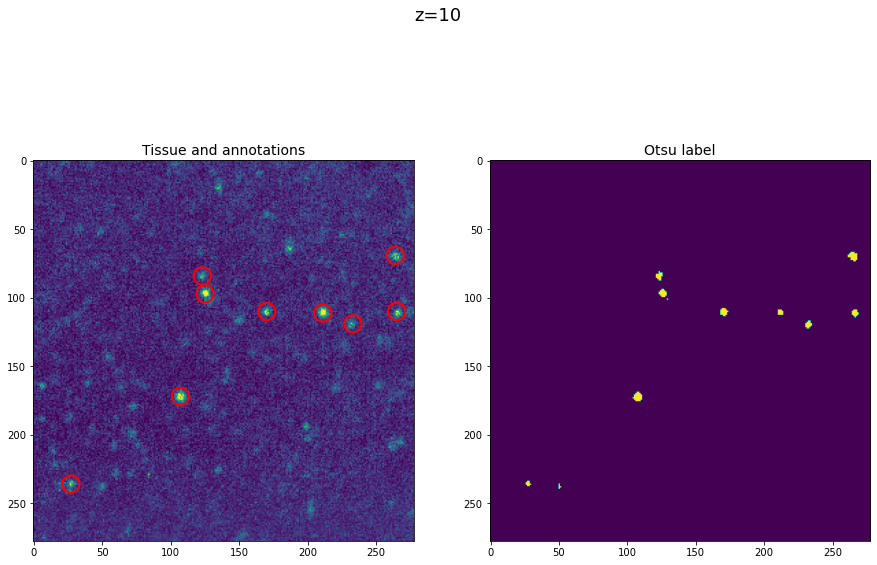

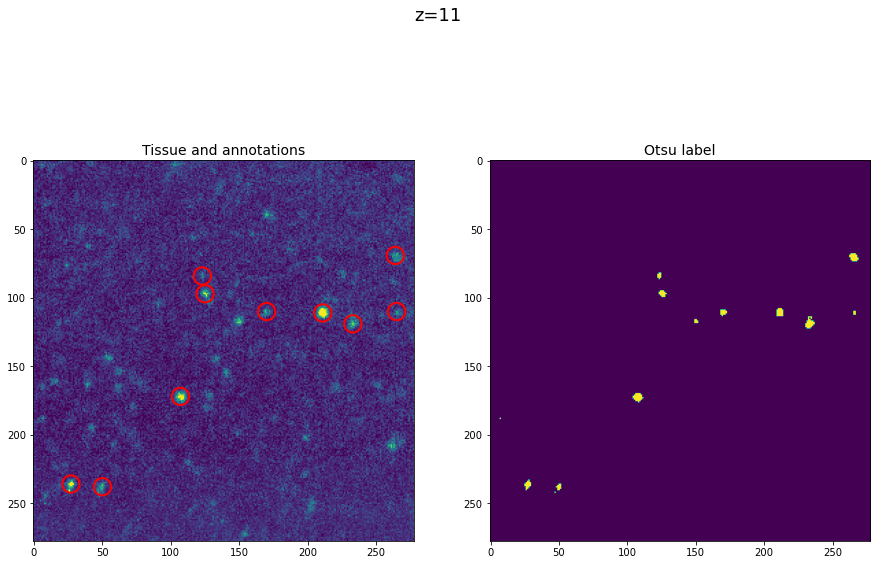

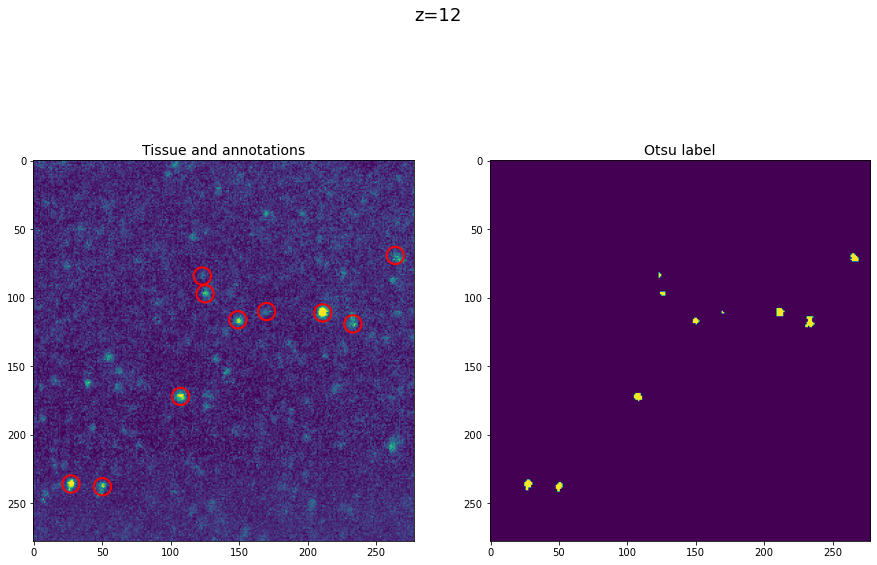

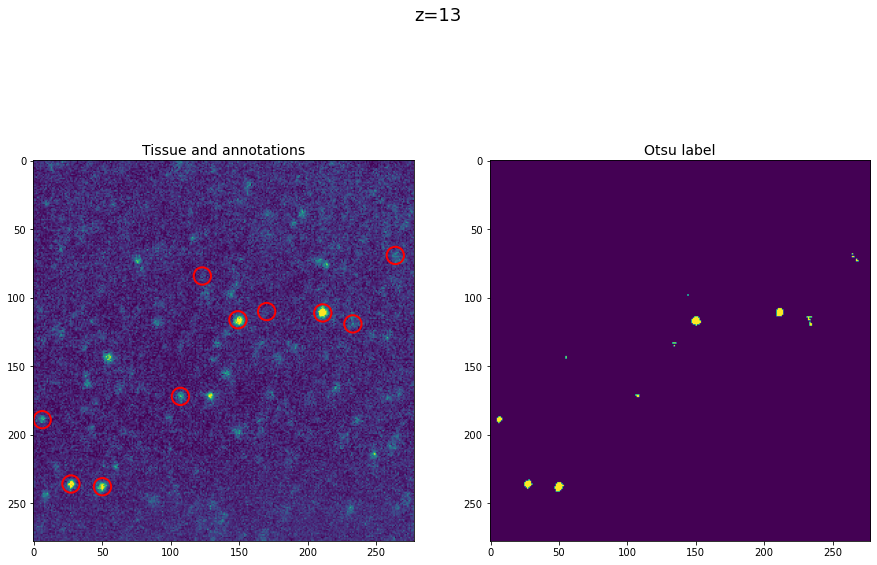

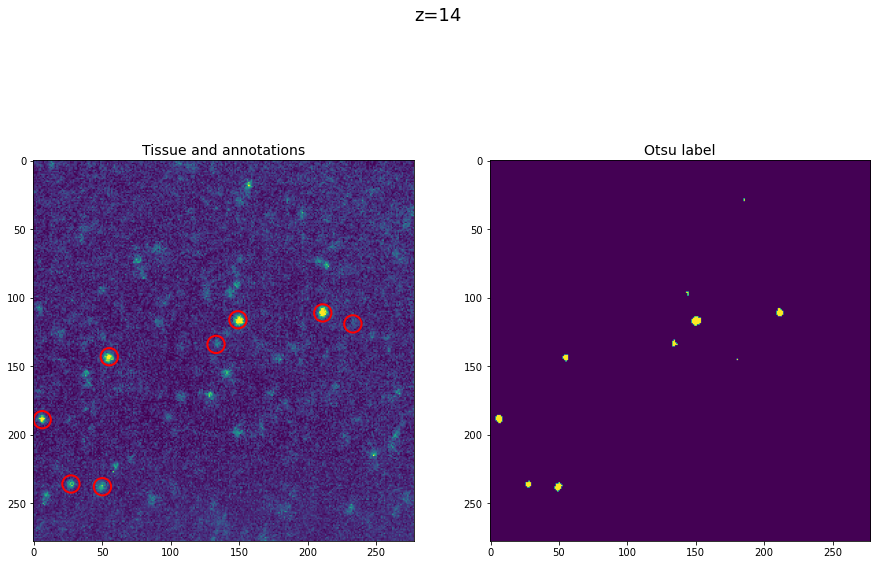

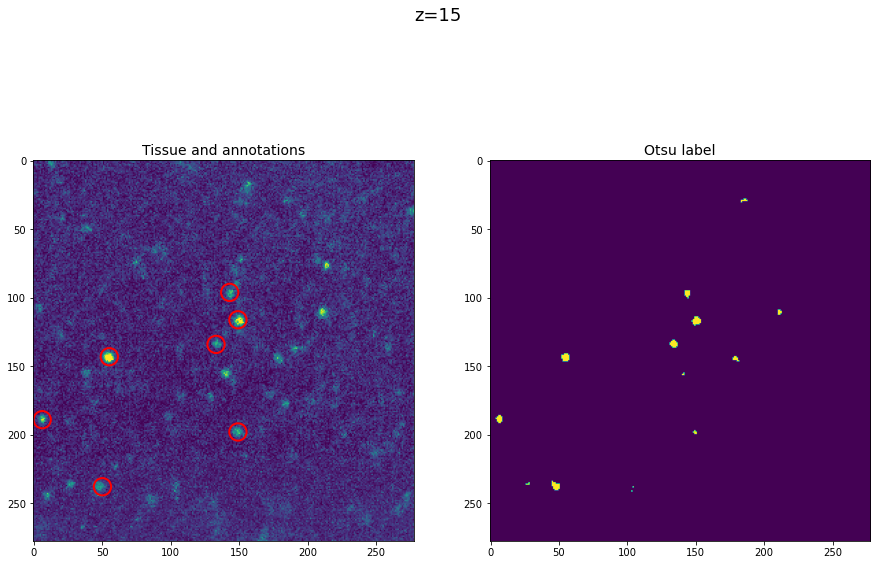

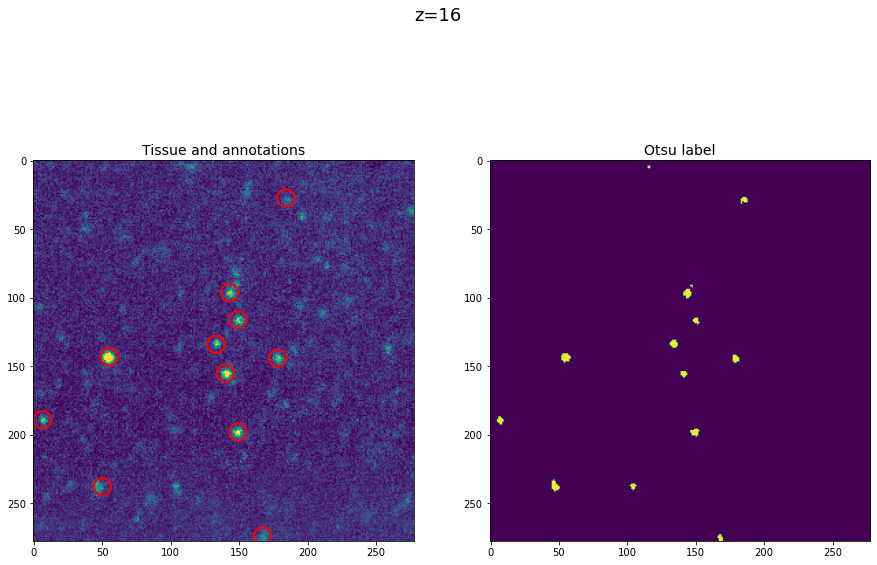

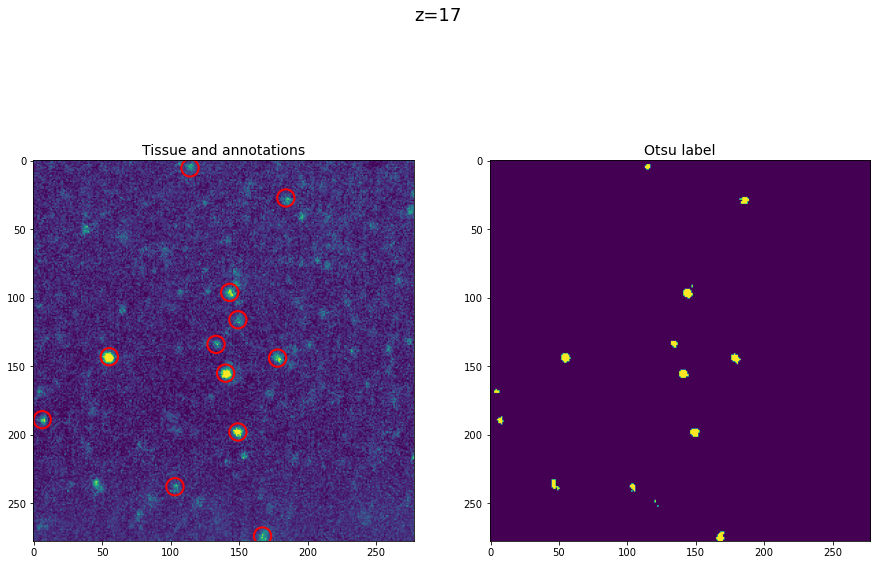

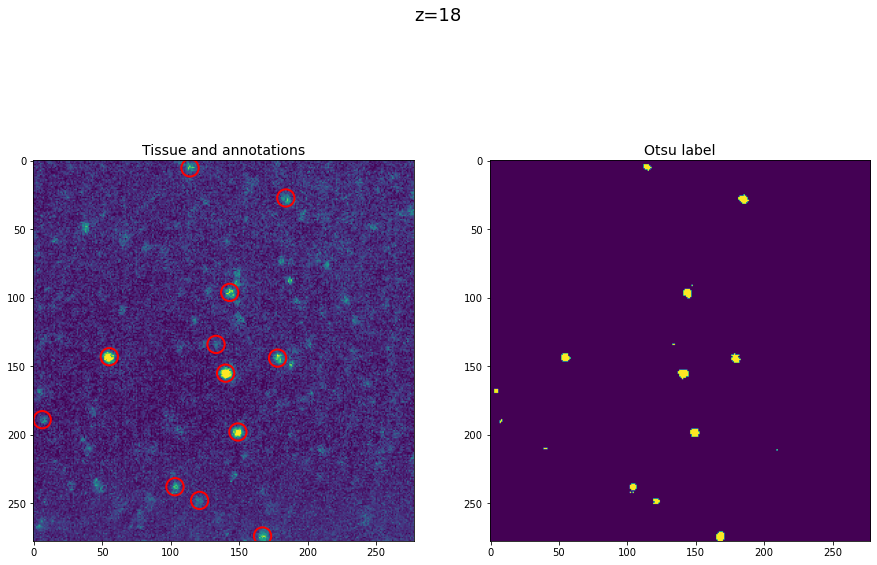

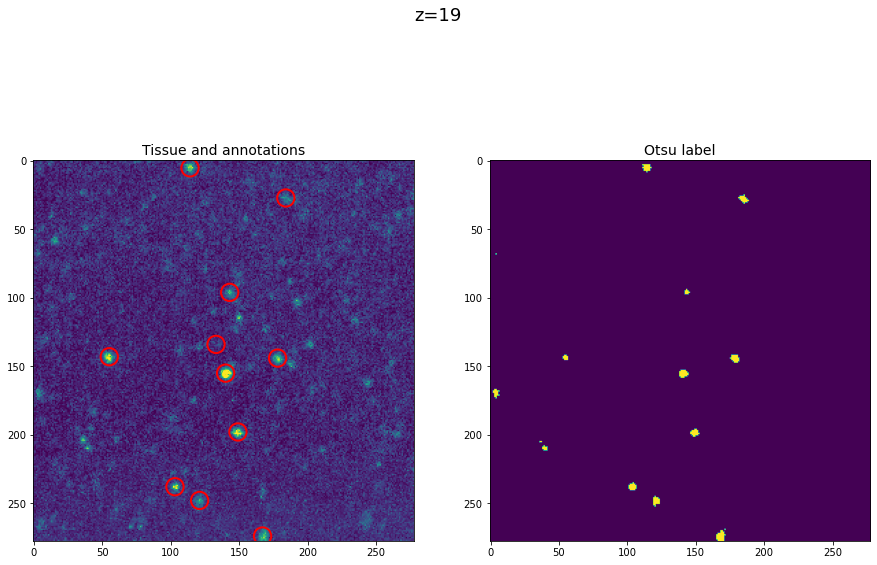

In [15]:
# Now check that the dilation gives a reasonable result.

point_depth = 6 # the number of planes over we collapse in z to show image and labels. Chosen because most cells extend this many planes
fontsize=14
for z in range(10,20):
    zmin=int(np.max([z-point_depth/2.,0]))
    zmax=int(np.min([z+point_depth/2.,75]))
#     mean_proj = np.mean(ws.source('stitched')[:,:,zmin:zmax],axis=2)

    points1_rel_depth = np.array([point for point in points1_rel if zmin <= point[-1] < zmax])
    xs_depth = points1_rel_depth[:,0]
    ys_depth = points1_rel_depth[:,1]

    fig = plt.figure(figsize=(15,10))
    fig.suptitle(f"z={z}",fontsize=18)
    ax_tiss=fig.add_subplot(121)
    subvol_thisplane = subvol[:,:,z]
    ax_tiss.imshow(subvol_thisplane.T,vmin=0,vmax=200)

    ax_tiss.scatter(xs_depth,ys_depth,
               color="none",edgecolor='r',
               marker='o',s=300,
              linewidth=2)
    ax_tiss.set_title("Tissue and annotations",fontsize=fontsize)
    
    ax_lbl=fig.add_subplot(122)
    lbl_subvol_thisplane = lbl_subvol[:,:,z]
    ax_lbl.imshow(lbl_subvol_thisplane.T,vmin=0,vmax=1)
    ax_lbl.set_title("Otsu label",fontsize=fontsize)
    


If there is too much speckling in the Otsu images, then try increasing the ostu_factor or increasing the sigma of the gaussian filter that is applied before the Otsu filter is applied. If the labels in the Otsu image look too smooth, then decrease the otsu_factor or decrease the sigma of the gaussian filter. 

In [ ]:
import glob, os
 
savename = 'training_subvolume.gif'
# Create the frames
pngs = sorted(glob.glob('./screenshot_00???.png'))
print(pngs)
frames = [Image.open(png) for png in pngs]

# Save into a GIF file that loops forever
frames[0].save(savename, format='GIF', 
               append_images=frames[1:],
               save_all=True,
               duration=200, # milliseconds
               loop=0)

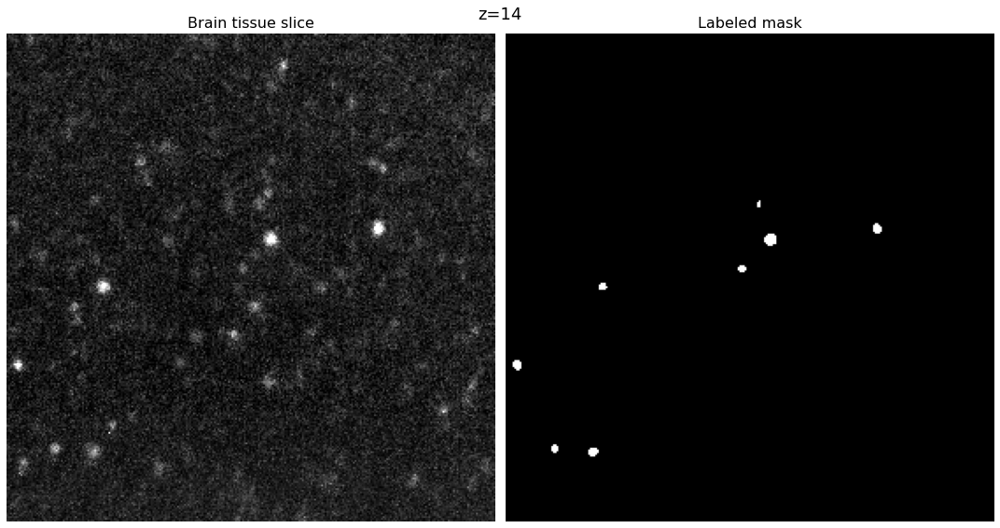

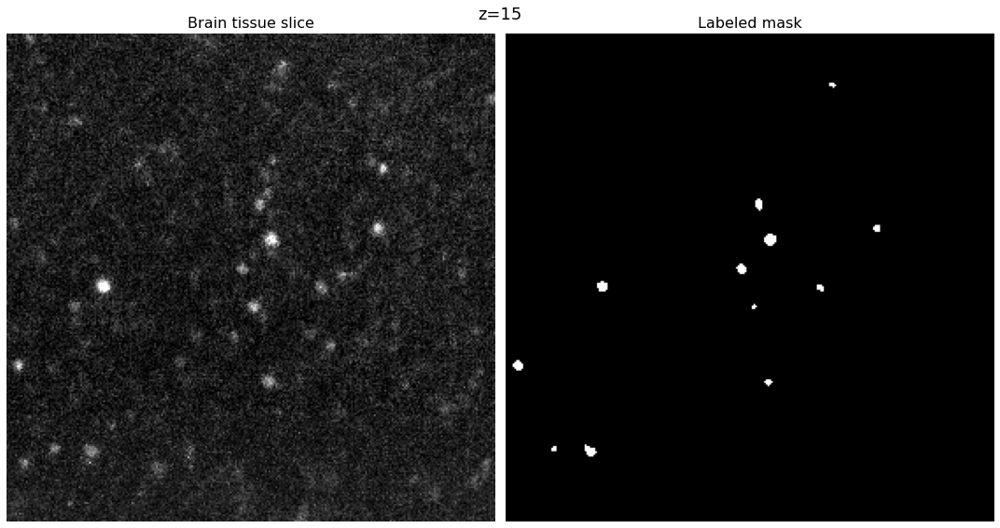

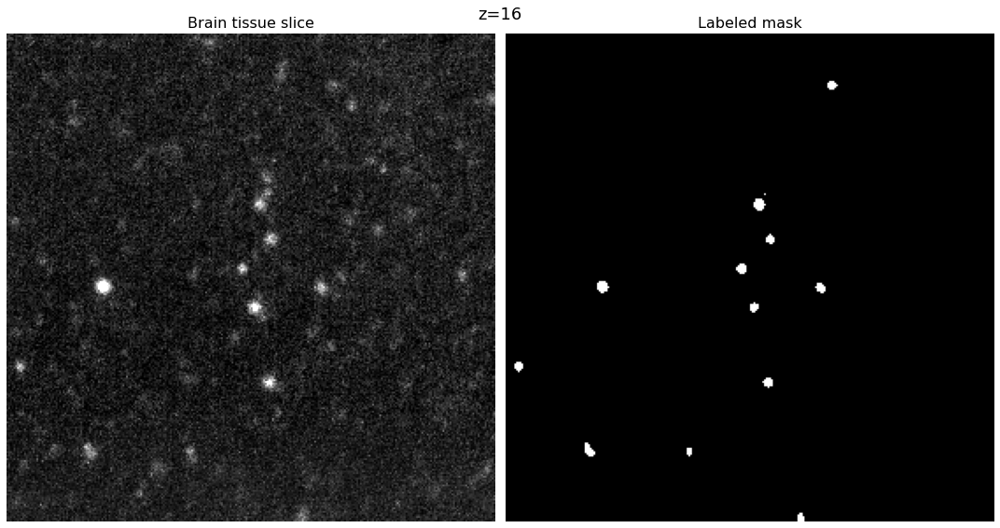

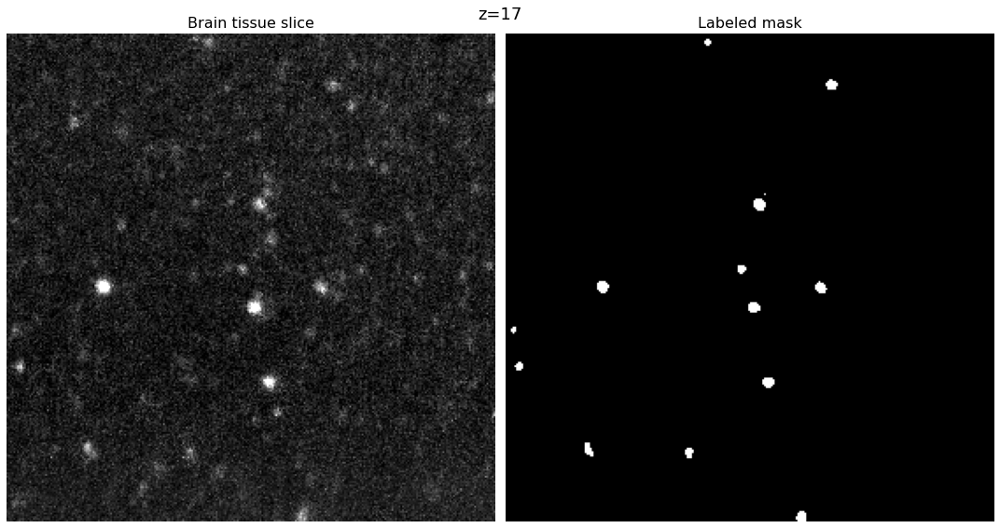

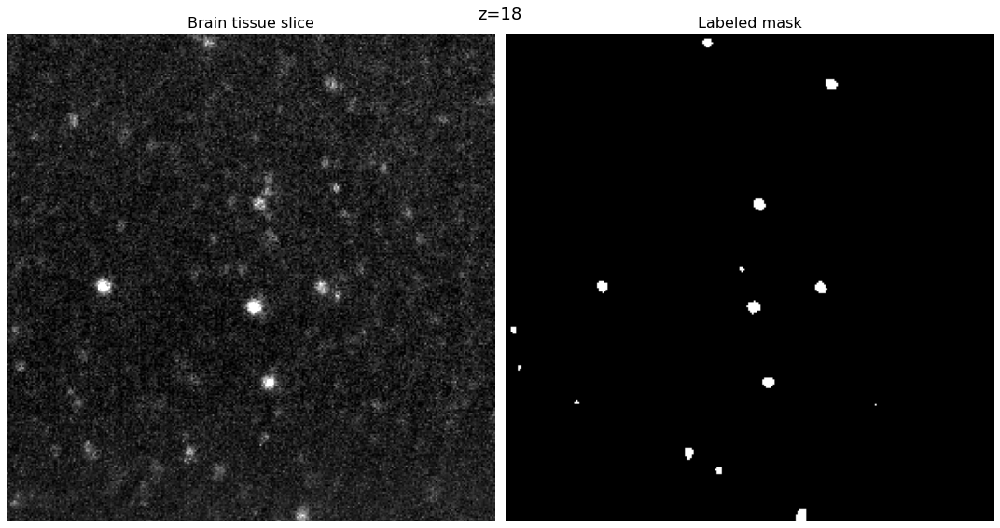

...

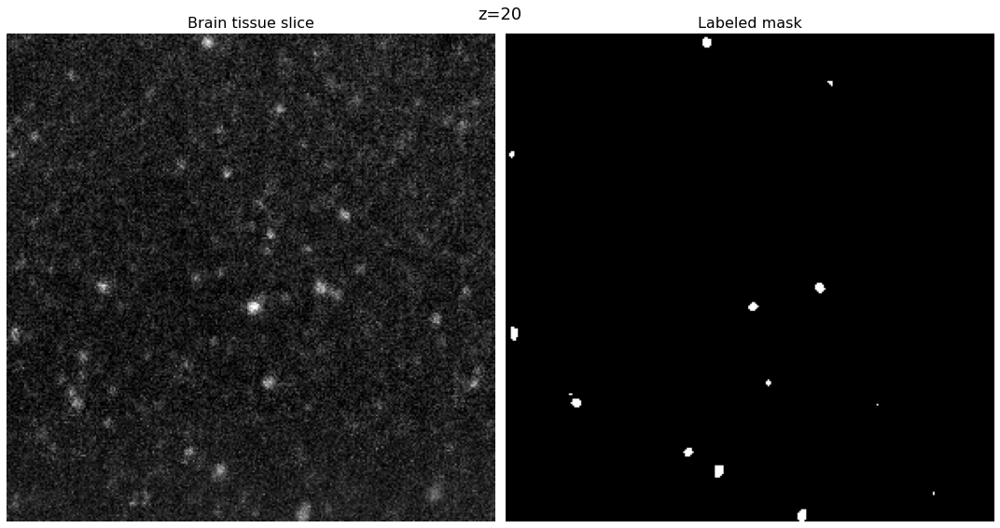

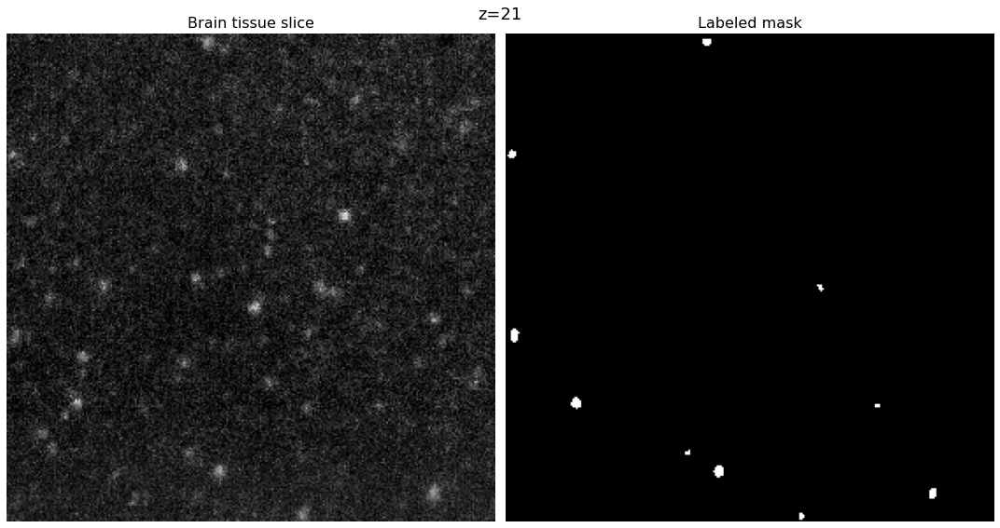

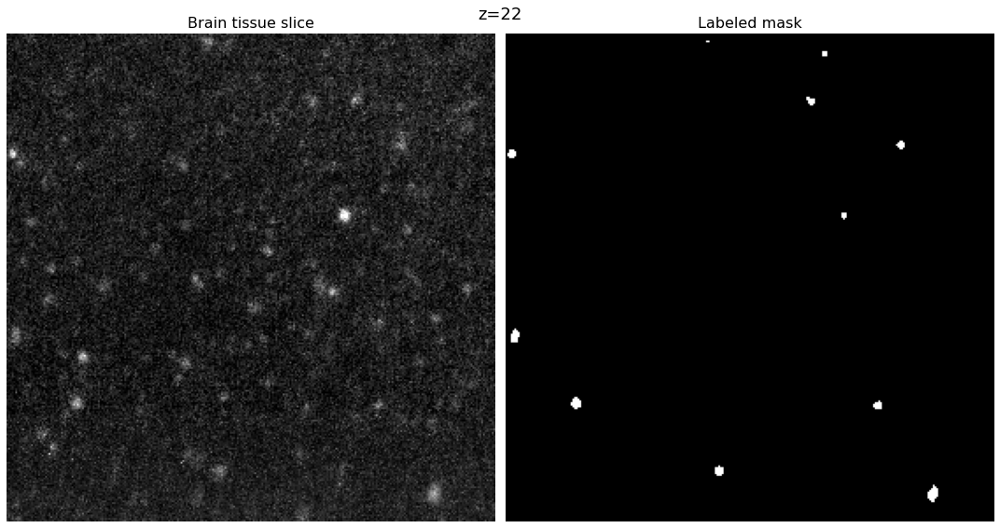

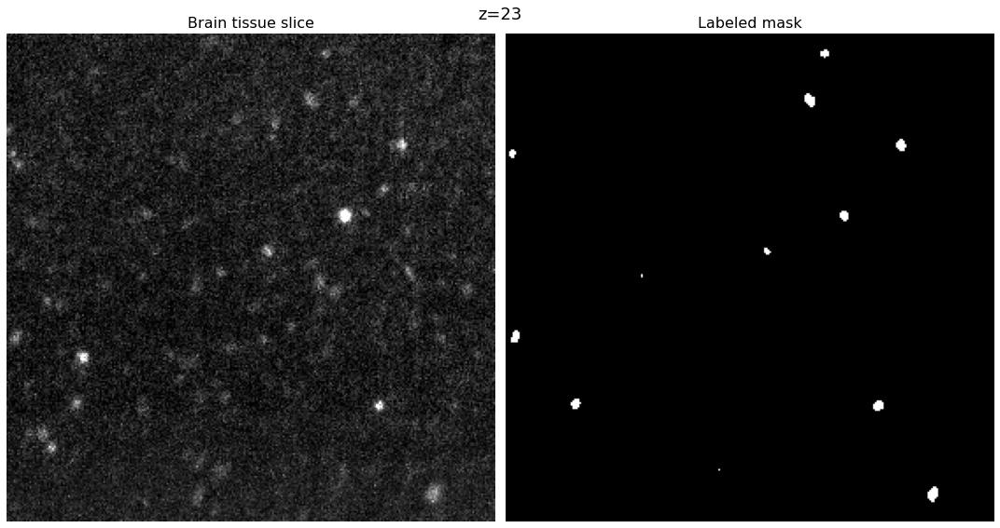

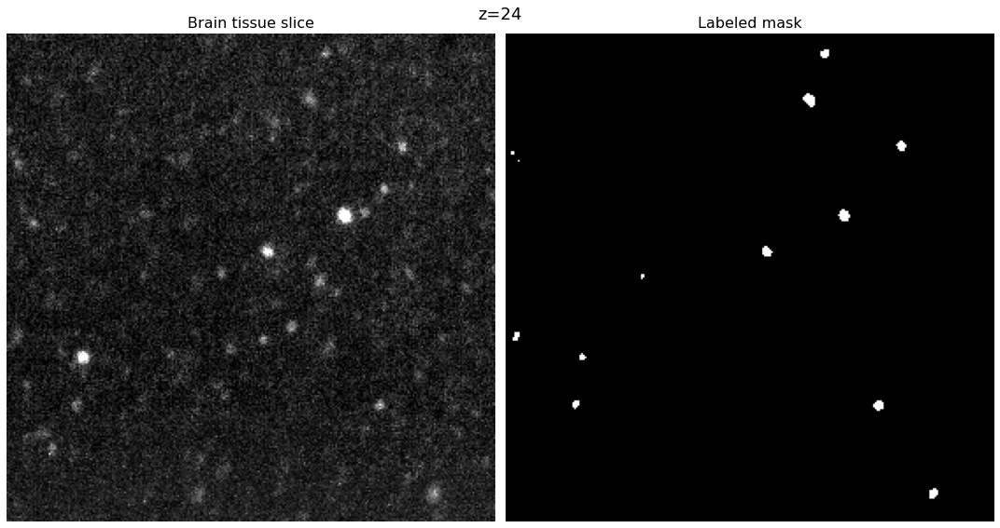

In [58]:
# Make a GIF from a portion of this training set  
point_depth = 6 # the number of planes over we collapse in z to show image and labels. Chosen because most cells extend this many planes
fontsize=16
for z in range(14,25):
# z=14
    zmin=int(np.max([z-point_depth/2.,0]))
    zmax=int(np.min([z+point_depth/2.,75]))
    #     mean_proj = np.mean(ws.source('stitched')[:,:,zmin:zmax],axis=2)

    points1_rel_depth = np.array([point for point in points1_rel if zmin <= point[-1] < zmax])
    xs_depth = points1_rel_depth[:,0]
    ys_depth = points1_rel_depth[:,1]

    fig = plt.figure(figsize=(15,8))
    fig.suptitle(f"z={z}",fontsize=18)
    ax_tiss=fig.add_subplot(121)
    ax_tiss.axis('off')
    subvol_thisplane = subvol[:,:,z]
    ax_tiss.imshow(subvol_thisplane.T,vmin=0,vmax=200,cmap='gray')

    # ax_tiss.scatter(xs_depth,ys_depth,
    #            color="none",edgecolor='r',
    #            marker='o',s=300,
    #           linewidth=2)
    ax_tiss.set_title("Brain tissue slice",fontsize=fontsize)

    ax_lbl=fig.add_subplot(122)

    lbl_subvol_thisplane = lbl_subvol[:,:,z]
    ax_lbl.imshow(lbl_subvol_thisplane.T,vmin=0,vmax=1,cmap='gray')
    ax_lbl.axis('off')
    ax_lbl.set_title("Labeled mask",fontsize=fontsize)
    fig.tight_layout()
    zsave = str(z).zfill(4)
    savename = f'../figs/unet_training_z{zsave}.png'
    plt.savefig(savename)

In [59]:
ls ../figs

training_subvolume.gif   unet_training_z0017.png  unet_training_z0021.png
unet_training_z0014.png  unet_training_z0018.png  unet_training_z0022.png
unet_training_z0015.png  unet_training_z0019.png  unet_training_z0023.png
unet_training_z0016.png  unet_training_z0020.png  unet_training_z0024.png


In [60]:
import glob, os
from PIL import Image
 
savename = '../figs/training_subvolume.gif'
# Create the frames
pngs = sorted(glob.glob('../figs/unet_training_z????.png'))
print(pngs)
frames = [Image.open(png) for png in pngs]

# Save into a GIF file that loops forever
frames[0].save(savename, format='GIF', 
               append_images=frames[1:],
               save_all=True, 
               duration=500, # milliseconds
               loop=0)

['../figs/unet_training_z0014.png', '../figs/unet_training_z0015.png', '../figs/unet_training_z0016.png', '../figs/unet_training_z0017.png', '../figs/unet_training_z0018.png', '../figs/unet_training_z0019.png', '../figs/unet_training_z0020.png', '../figs/unet_training_z0021.png', '../figs/unet_training_z0022.png', '../figs/unet_training_z0023.png', '../figs/unet_training_z0024.png']


<img src="training_subvolume3.gif">

# Save out the subvolume and the otsu label to tif files.

Make sure to keep the sample name and subvolume starting pixels in the filenames so they can be linked up when training the net.

In [32]:
mkdir ../training_set

mkdir: cannot create directory ‘../training_set’: File exists


In [33]:
savefile_img = '../training_set/zimmerman_01-001_subvol_x1111_y2778_z2500_img.tif'
savefile_lbl = '../training_set/zimmerman_01-001_subvol_x1111_y2778_z2500_lbl.tif'

tifffile.imsave(savefile_img,subvol)
tifffile.imsave(savefile_lbl,lbl_subvol)

In [34]:
ls ../training_set/

zimmerman_01-001_subvol_x1111_y2778_z2500_img.tif
zimmerman_01-001_subvol_x1111_y2778_z2500_lbl.tif


In [16]:
savefile_img = '../training_set/zimmerman_01-001_subvol_x1111_y2778_z2500_img.tif'
vol = tifffile.imread(savefile_img)

In [18]:
pwd

'/mnt/bucket/labs/wang/ahoag/test_cnn/notebooks'

# Repeat for additional subvolumes once you have your parameters set

In [35]:
# Load in annotations from exported Neuroglancer annotation file
subvol_annotation_files = ['../data/annotations_zimmerman_01-001_subvol_x1400_y4500_z1150.csv',
                           '../data/annotations_zimmerman_01-001_subvol_x4444_y1667_z1500.csv']


../data/annotations_zimmerman_01-001_subvol_x1400_y4500_z1150.csv
(1400, 4500, 1150)
Stitched subvolume already exists: /jukebox/wang/ahoag/test_clearmap2/output/cz15/zimmerman_01_smartspim/zimmerman_01-001/imaging_request_1/output/subvol_x1400_y4500_z1150_stitched.npy

Saved img and lbl subvolumes:
../training_set/zimmerman_01-001_subvol_x1400_y4500_z1150_img.tif
../training_set/zimmerman_01-001_subvol_x1400_y4500_z1150_lbl.tif
../data/annotations_zimmerman_01-001_subvol_x4444_y1667_z1500.csv
(4444, 1667, 1500)
Stitched subvolume already exists: /jukebox/wang/ahoag/test_clearmap2/output/cz15/zimmerman_01_smartspim/zimmerman_01-001/imaging_request_1/output/subvol_x4444_y1667_z1500_stitched.npy

Saved img and lbl subvolumes:
../training_set/zimmerman_01-001_subvol_x4444_y1667_z1500_img.tif
../training_set/zimmerman_01-001_subvol_x4444_y1667_z1500_lbl.tif


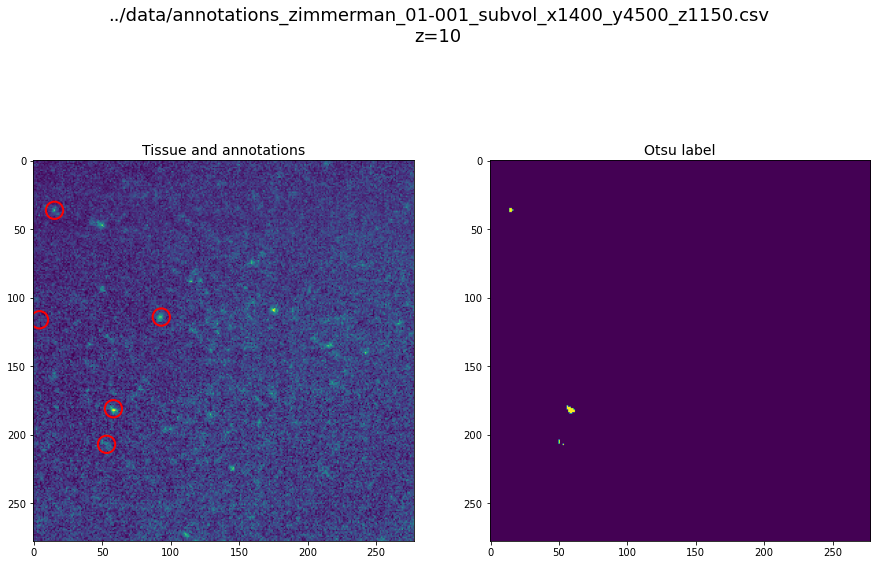

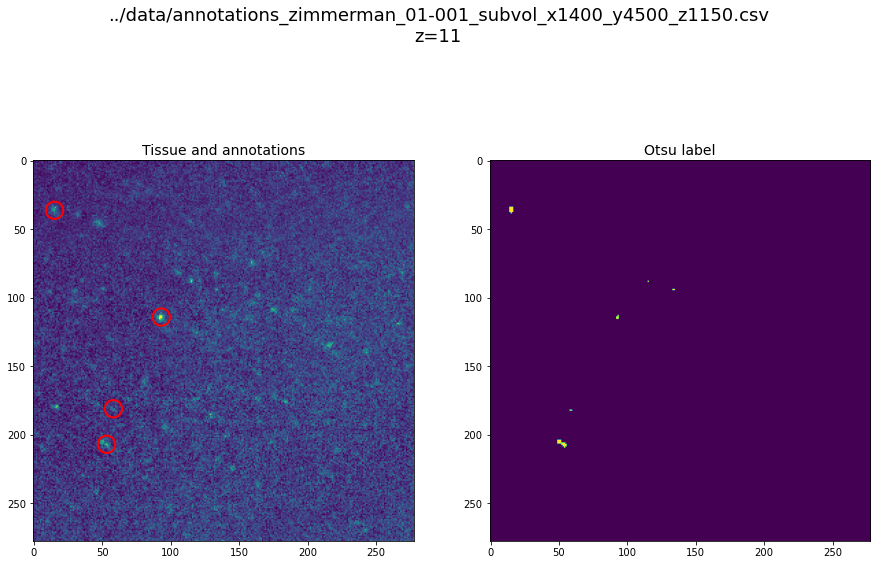

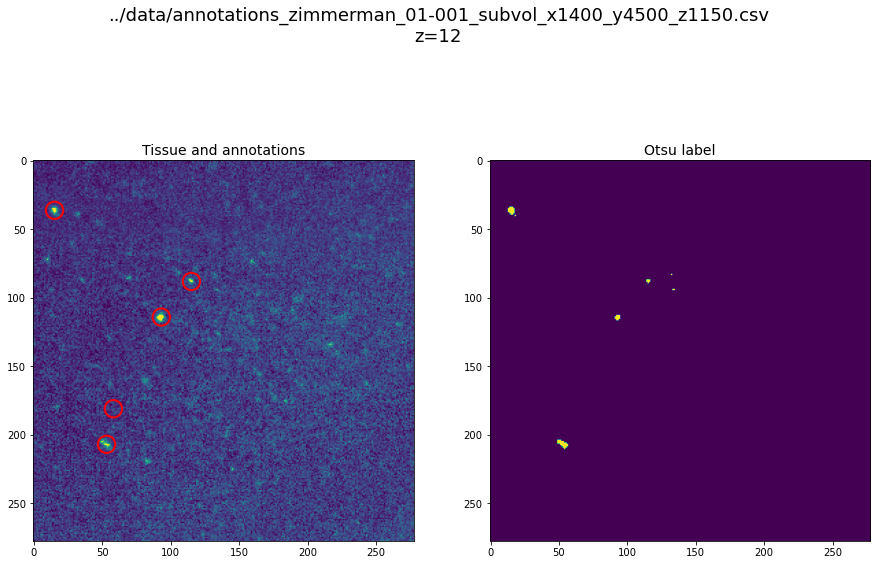

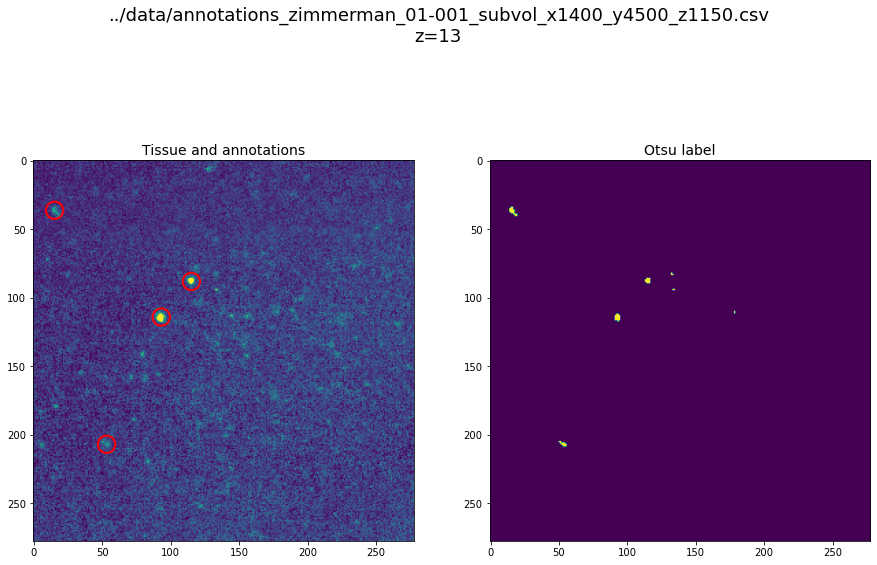

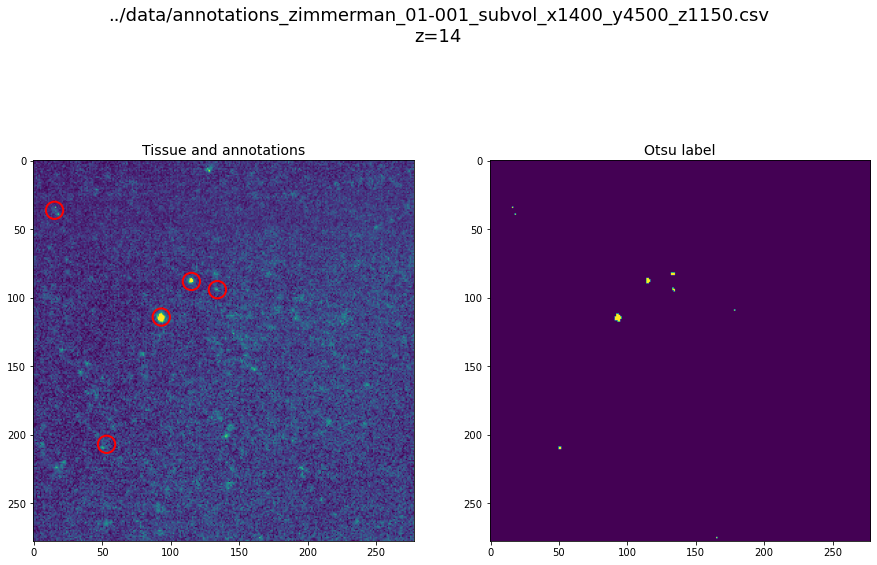

...

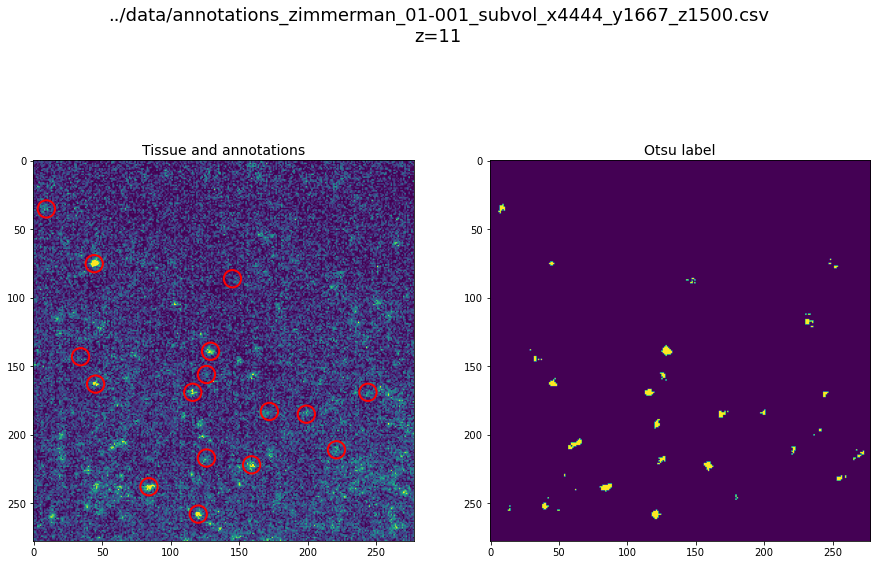

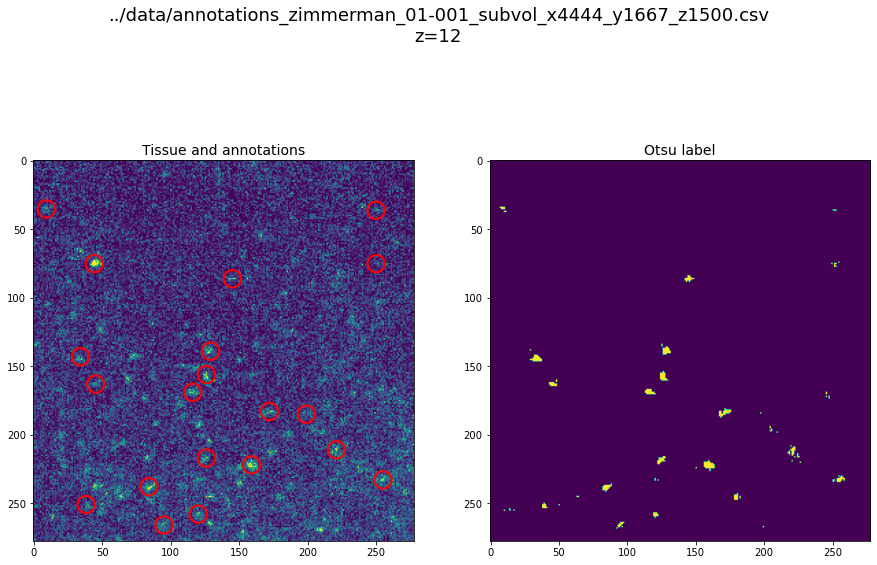

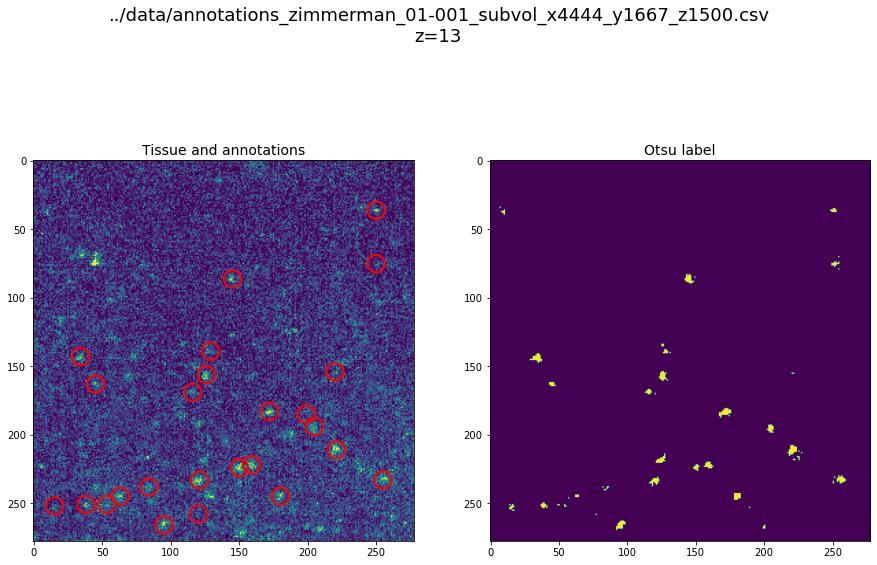

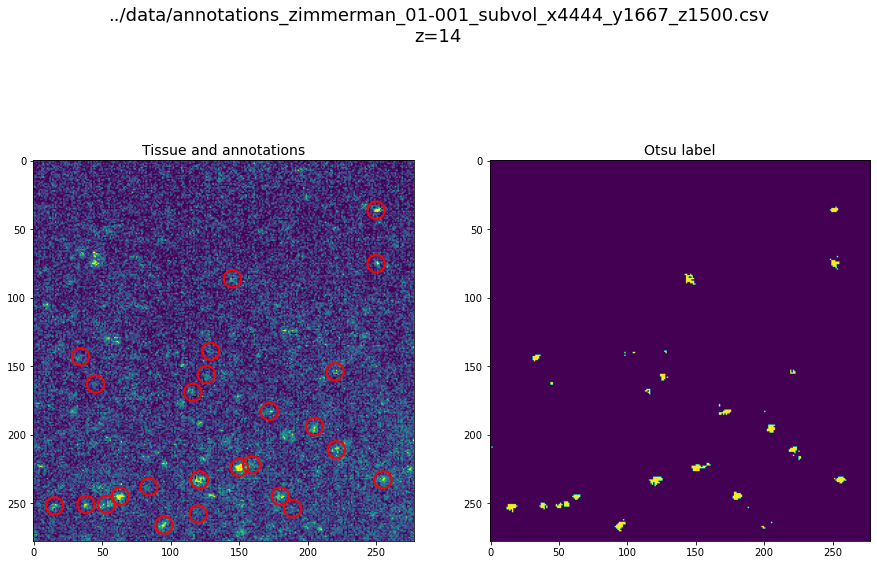

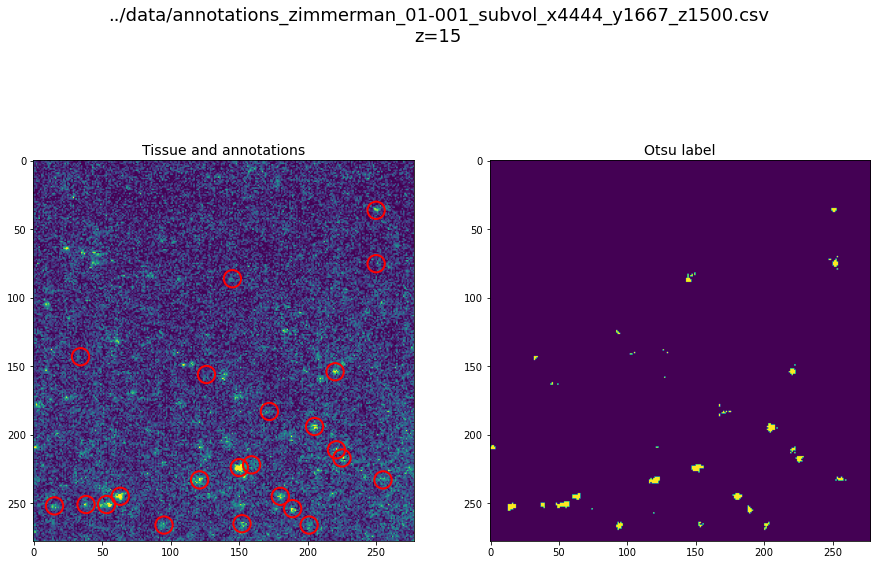

In [55]:
for subvol_annotation_file in subvol_annotation_files:
    print(subvol_annotation_file)
    # Remove any duplicates which can happen pretty easily by accident when labeling in Neuroglancer  
    df = pd.read_csv(subvol_annotation_file)
    df.drop_duplicates(inplace=True)
    # Get the x,y,z origin of the subvolume from the filename
    xstr,ystr,zstr = subvol_annotation_file.split('_')[-3:]
    x_start_bigvol = int(xstr[1:])
    y_start_bigvol = int(ystr[1:])
    z_start_bigvol = int(zstr.split('.csv')[0][1:])
    subvol_pix_start = (x_start_bigvol,y_start_bigvol,z_start_bigvol)
    mm_subvol=(0.5,0.5,0.15) # Make sure this is true for all subvolumes!
    microns_per_pix = (1.8,1.8,2)
    microns_subvol = [x*1000 for x in mm_subvol]
    npix_subvol = [int(round(microns_subvol[ii]/microns_per_pix[ii])) for ii in range(3)]
    print(subvol_pix_start)
    # Make the subvolume from the larger stitched volume by slicing
    x_start = subvol_pix_start[0]
    x_finish = x_start + npix_subvol[0]
    y_start = subvol_pix_start[1]
    y_finish = y_start + npix_subvol[1]
    z_start = subvol_pix_start[2]
    z_finish = z_start + npix_subvol[2]
    ws.debug = f'subvol_x{x_start_bigvol}_y{y_start_bigvol}_z{z_start_bigvol}' # Set this to the cutout start coordinates
    if not os.path.exists(ws.filename('stitched')):
        slicing = (slice(x_start,x_finish),slice(y_start,y_finish),slice(z_start,z_finish))
        ws.create_debug('stitched', slicing=slicing) # creates a file called 
        print(f"Created {ws.filename('stitched')}")
    else:
        print(f"Stitched subvolume already exists: {ws.filename('stitched')}")
    # Load in points
    points_abs = np.array(list(map(eval,df['Coordinate 1'].values))) # coordinates relative to origin of entire brain volume
    # Need to get into relative coordinates of the subvolume
    points_rel = points_abs-(x_start,y_start,z_start) # coordinates relative to the origin of the subvolume
    
    # Make the dilated array
    subvol=ws.source('stitched').array
    # Note that we use the cell center coordinates relative to the subvolume origin (points_rel)
    # and not the ones relative to the entire brain origin (points1_abs)
    lbl_subvol = make_labeled_subvol(subvolume=subvol,
                                     points=points_rel) 
    # Save out the subvolume and dilated array
    savefile_img = f'../training_set/zimmerman_01-001_subvol_x{x_start_bigvol}_y{y_start_bigvol}_z{z_start_bigvol}_img.tif'
    savefile_lbl = f'../training_set/zimmerman_01-001_subvol_x{x_start_bigvol}_y{y_start_bigvol}_z{z_start_bigvol}_lbl.tif'

    tifffile.imsave(savefile_img,subvol)
    tifffile.imsave(savefile_lbl,lbl_subvol)
    print()
    print("Saved img and lbl subvolumes:")
    print(savefile_img)
    print(savefile_lbl)
    for z in range(10,16):
        zmin=int(np.max([z-point_depth/2.,0]))
        zmax=int(np.min([z+point_depth/2.,75]))
    #     mean_proj = np.mean(ws.source('stitched')[:,:,zmin:zmax],axis=2)

        points_rel_depth = np.array([point for point in points_rel if zmin <= point[-1] < zmax])
        xs_depth = points_rel_depth[:,0]
        ys_depth = points_rel_depth[:,1]

        fig = plt.figure(figsize=(15,10))
        fig.suptitle(f"{subvol_annotation_file}\nz={z}",fontsize=18)
        ax_tiss=fig.add_subplot(121)
        subvol_thisplane = subvol[:,:,z]
        ax_tiss.imshow(subvol_thisplane.T,vmin=0,vmax=200)

        ax_tiss.scatter(xs_depth,ys_depth,
                   color="none",edgecolor='r',
                   marker='o',s=300,
                  linewidth=2)
        ax_tiss.set_title("Tissue and annotations",fontsize=fontsize)

        ax_lbl=fig.add_subplot(122)
        lbl_subvol_thisplane = lbl_subvol[:,:,z]
        ax_lbl.imshow(lbl_subvol_thisplane.T,vmin=0,vmax=1)
        ax_lbl.set_title("Otsu label",fontsize=fontsize)

Seems to be working!

In [19]:
pwd

'/mnt/bucket/labs/wang/ahoag/test_cnn/notebooks'

In [20]:
ls ../training_set/

zimmerman_01-001_subvol_x1111_y2778_z2500_img.tif
zimmerman_01-001_subvol_x1111_y2778_z2500_lbl.tif
zimmerman_01-001_subvol_x1400_y4500_z1150_img.tif
zimmerman_01-001_subvol_x1400_y4500_z1150_lbl.tif
zimmerman_01-001_subvol_x4444_y1667_z1500_img.tif
zimmerman_01-001_subvol_x4444_y1667_z1500_lbl.tif


In [21]:
import glob

In [22]:
f = '../training_set/zimmerman_01-001_subvol_x1111_y2778_z2500_img.tif'
im = tifffile.imread(f)

In [23]:
im.shape

(278, 278, 75)

In [27]:
im_reshaped = np.swapaxes(im,0,2)

In [28]:
im_reshaped.shape

(75, 278, 278)

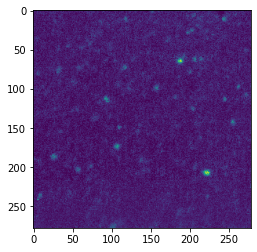

In [29]:
plt.imshow(im_reshaped[0])

In [26]:
np.swapaxes?

In [31]:
tifffile.imsave?

In [32]:
fs = glob.glob('../training_set/*tif')
for f in fs:
    im = tifffile.imread(f)
    im_reshaped = np.swapaxes(im,0,2)
    outf = f.replace('.tif','_reshaped.tif')
    tifffile.imsave(outf,im_reshaped)

In [33]:
pwd

'/mnt/bucket/labs/wang/ahoag/test_cnn/notebooks'

In [34]:
ls ../data

annotations_zimmerman_01-001_subvol_x1111_y2778_z2500.csv
annotations_zimmerman_01-001_subvol_x1400_y4500_z1150.csv
annotations_zimmerman_01-001_subvol_x4444_y1667_z1500.csv


In [35]:
ls ../training_set

zimmerman_01-001_subvol_x1111_y2778_z2500_img_reshaped.tif
zimmerman_01-001_subvol_x1111_y2778_z2500_img.tif
zimmerman_01-001_subvol_x1111_y2778_z2500_lbl_reshaped.tif
zimmerman_01-001_subvol_x1111_y2778_z2500_lbl.tif
zimmerman_01-001_subvol_x1400_y4500_z1150_img_reshaped.tif
zimmerman_01-001_subvol_x1400_y4500_z1150_img.tif
zimmerman_01-001_subvol_x1400_y4500_z1150_lbl_reshaped.tif
zimmerman_01-001_subvol_x1400_y4500_z1150_lbl.tif
zimmerman_01-001_subvol_x4444_y1667_z1500_img_reshaped.tif
zimmerman_01-001_subvol_x4444_y1667_z1500_img.tif
zimmerman_01-001_subvol_x4444_y1667_z1500_lbl_reshaped.tif
zimmerman_01-001_subvol_x4444_y1667_z1500_lbl.tif


In [36]:
f = '../training_set/zimmerman_01-001_subvol_x1111_y2778_z2500_img_reshaped.tif'
im = tifffile.imread(f)
im.shape

(75, 278, 278)